## Importar librerías

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
from ipywidgets import interact

In [4]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler

In [5]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [6]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet, Ridge, Lars, BayesianRidge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingClassifier
from sklearn.metrics import mean_squared_error

In [7]:
from xgboost import XGBRegressor
from xgboost import plot_importance
from yellowbrick.regressor import ResidualsPlot

In [8]:
import ppscore as pps

# Plots - distribuciones

Importamos los datos y dibujamos las distribuciones de las variables

In [9]:
plt.rcParams['figure.figsize'] = (16,10)

In [10]:
df = pd.read_csv('./Data/data_nba.csv', index_col=0)

In [11]:
df.select_dtypes(exclude=object).columns

Index(['role', 'MP', 'FG', 'FGA', 'FG_PCT', 'FG3', 'FG3A', 'FG3_PCT', 'FT',
       'FTA', 'FT_PCT', 'ORB', 'DRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS',
       'PLUS_MINUS', 'season_end', 'salary', 'height', 'weight', 'age',
       'pos_PG', 'pos_C', 'pos_PF', 'pos_SG', 'pos_SF', 'hand_right',
       'hand_left'],
      dtype='object')

# Feature engineering

A continuación haremos modificaciones en nuestras variables para quedarnos solamente con la información relevante y evitar duplicar información.

Comprobamos que los tiros de campo incluyen los triples.

In [12]:
(df['FG']*2 + df['FG3']*3 + df['FT'] == df['PTS']).value_counts()

True     335030
False    204392
dtype: int64

Restamos los triples a los tiros de campo para no duplicar información.

In [13]:
df['FG'] = df['FG'] - df['FG3']
df['FGA'] = df['FGA'] - df['FG3A']

Vemos como ahora los tiros de campo x2 + los triples x3 + los tiros libres x1 siempre son iguales a los puntos.

In [14]:
(df['FG']*2 + df['FG3']*3 + df['FT'] == df['PTS']).value_counts()

True    539422
dtype: int64

Eliminamos las columnas de los porcentajes porque las recalcularemos más adelante, además de que habrá diferencias tras haber restado los triples a los tiros de campo.

In [15]:
df.drop(['FG_PCT', 'FG3_PCT', 'FT_PCT'], axis=1, inplace=True)

## Groupby player & season - data per game

El objetivo es crear un diccionario cada una de cuyas observaciones sea un df con la suma de los datos de campo de cada jugador para cada temporada pero mostrando los datos por partido, para que al hacer clustering se quede con el estilo de juego de cada jugador.

In [16]:
# Definimos las columnas con los datos de campo

field_columns = ['player', 'MP', 'FG', 'FGA', 'FG3', 'FG3A', 'FT',
        'FTA', 'ORB', 'DRB','AST', 'STL', 'BLK', 'TOV', 'PF', 'PLUS_MINUS',
                'role'] # BORRAR MÁS ADELANTE SI NO VA BIEN

In [17]:
# Definimos las columnas con otros datos igualmente interesantes

other_columns = ['player', 'team', 'season_end', 'salary', 'height', 'weight', 'age',
       'pos_PG', 'pos_C', 'pos_PF', 'pos_SG', 'pos_SF', 'hand_right',
       'hand_left']

Creamos un dataframe con el % de partidos jugados como titular por temporada y jugador

In [18]:
titular = df[['role', 'player','season_end']].groupby(['player','season_end']).sum() / df[['role', 'player','season_end']].groupby(['player','season_end']).count()

In [19]:
titular.reset_index(inplace=True)

In [20]:
titular[titular['player']=='Marc Gasol']

,player,season_end,role
5972,Marc Gasol,2009,0.914634
5973,Marc Gasol,2010,1.000000
5974,Marc Gasol,2011,1.000000
5975,Marc Gasol,2012,1.000000
5976,Marc Gasol,2013,1.000000
5977,Marc Gasol,2014,1.000000
5978,Marc Gasol,2015,1.000000
5979,Marc Gasol,2016,1.000000
5980,Marc Gasol,2017,1.000000
5981,Marc Gasol,2018,1.000000


Creamos el diccionario

In [21]:
# Creamos el diccionario

stats_pg = dict()
for y in range(2001,2022):
    stats_pg[y] = df[df['season_end']==y].groupby('player')[field_columns].sum().merge(df[df['season_end']==y][other_columns],
                                        on='player', how='left').drop_duplicates('player').reset_index(drop=True)

In [22]:
# Comprobamos las columnas

stats_pg[2001].columns

Index(['player', 'MP', 'FG', 'FGA', 'FG3', 'FG3A', 'FT', 'FTA', 'ORB', 'DRB',
       'AST', 'STL', 'BLK', 'TOV', 'PF', 'PLUS_MINUS', 'role', 'team',
       'season_end', 'salary', 'height', 'weight', 'age', 'pos_PG', 'pos_C',
       'pos_PF', 'pos_SG', 'pos_SF', 'hand_right', 'hand_left'],
      dtype='object')

Cada una de las observaciones del diccionario es un dataframe que representa una temporada. En ese dataframe están los datos agregados por jugador y le vamos a añadir el porcentaje de titularidades.

In [23]:
# Primero añadimos las 2 columnas de nuestro dataframe 'titular'

for year in range(2001,2022):
    stats_pg[year] = stats_pg[year].merge(titular[titular['season_end']==year], on='player')

In [24]:
# Ha cambiado de nombre 'season_end' a 'season_end_x' y ha creado otra columna igual 'season_end_y'

# Ha creado la columna que nos interesaba 'role_y'

stats_pg[2001].columns

Index(['player', 'MP', 'FG', 'FGA', 'FG3', 'FG3A', 'FT', 'FTA', 'ORB', 'DRB',
       'AST', 'STL', 'BLK', 'TOV', 'PF', 'PLUS_MINUS', 'role_x', 'team',
       'season_end_x', 'salary', 'height', 'weight', 'age', 'pos_PG', 'pos_C',
       'pos_PF', 'pos_SG', 'pos_SF', 'hand_right', 'hand_left', 'season_end_y',
       'role_y'],
      dtype='object')

In [25]:
# Comprobamos que las temporadas se han pasado correctamente y que no hay valores vacíos en 'role'

for year in range(2001,2022):

    print(year, (stats_pg[year]['season_end_x'] == stats_pg[year]['season_end_y']).value_counts())
    print(year, stats_pg[year]['role_y'].isna().sum())

2001 True    424
dtype: int64
2001 0
2002 True    424
dtype: int64
2002 0
2003 True    416
dtype: int64
2003 0
2004 True    419
dtype: int64
2004 0
2005 True    440
dtype: int64
2005 0
2006 True    444
dtype: int64
2006 0
2007 True    453
dtype: int64
2007 0
2008 True    440
dtype: int64
2008 0
2009 True    439
dtype: int64
2009 0
2010 True    433
dtype: int64
2010 0
2011 True    445
dtype: int64
2011 0
2012 True    448
dtype: int64
2012 0
2013 True    448
dtype: int64
2013 0
2014 True    385
dtype: int64
2014 0
2015 True    476
dtype: int64
2015 0
2016 True    464
dtype: int64
2016 0
2017 True    466
dtype: int64
2017 0
2018 True    467
dtype: int64
2018 0
2019 True    522
dtype: int64
2019 0
2020 True    507
dtype: int64
2020 0
2021 True    529
dtype: int64
2021 0


In [26]:
# Ahora ya podemos modificar las columnas

for year in range(2001,2022):
    
    # Renombramos las columnas
    stats_pg[year].rename(columns={'season_end_x': 'season_end',
                                   'role_y': 'ROL'}, inplace=True)
    
    # Eliminamos la columna duplicada y la columna role_x que no nos interesa más
    stats_pg[year].drop(['season_end_y','role_x'], axis=1, inplace=True)

In [27]:
stats_pg[2001].columns

Index(['player', 'MP', 'FG', 'FGA', 'FG3', 'FG3A', 'FT', 'FTA', 'ORB', 'DRB',
       'AST', 'STL', 'BLK', 'TOV', 'PF', 'PLUS_MINUS', 'team', 'season_end',
       'salary', 'height', 'weight', 'age', 'pos_PG', 'pos_C', 'pos_PF',
       'pos_SG', 'pos_SF', 'hand_right', 'hand_left', 'ROL'],
      dtype='object')

Creamos una variable con las columnas que no usaremos en el clustering

In [28]:
# Columnas que no usaremos en el clustering

non_clustering_columns = ['player', 'team', # Categóricas con nombre del jugador
                          'hand_right', 'hand_left', # No será relevante si son zurdos o diestros
                          'MP', 'salary', # Los minutos jugados no recogen el estilo de juego
                          'FG','FGA','FG3','FG3A','FT','FTA', # Nos quedaremos sólo con los porcentajes de tiro
                          'season_end', # Aplicaremos clustering una vez a cada temporada
                          'age','PF','PLUS_MINUS', # La edad, las faltas y el balance también los eliminaremos
                          'ROL'] # Si son titulares o no tampoco es relevante para identificar posiciones

In [29]:
for y in range(2001,2022):
    
    # Primero filtramos los jugadores con menos de 100 minutos ya que pueden mostrar resultados engañosos por partido
    stats_pg[y] = stats_pg[y][stats_pg[y]['MP'] >= 100].reset_index(drop=True)
    
    # Porcentaje de tiros de campo
    stats_pg[y]['FG_pc'] = stats_pg[y]['FG'] / stats_pg[y]['FGA']
    
    # Porcentaje de triples
    stats_pg[y]['FG3_pc'] = stats_pg[y]['FG3'] / stats_pg[y]['FG3A']
    
    # Porcentaje de tiros libres
    stats_pg[y]['FT_pc'] = stats_pg[y]['FT'] / stats_pg[y]['FTA']
    
    # Rebotes ofensivos por partido
    stats_pg[y]['ORB'] = stats_pg[y]['ORB'] / stats_pg[y]['MP'] * 48

    # Rebotes defensivos por partido
    stats_pg[y]['DRB'] = stats_pg[y]['DRB'] / stats_pg[y]['MP'] * 48

    # Asistencias por partido
    stats_pg[y]['AST'] = stats_pg[y]['AST'] / stats_pg[y]['MP'] * 48
    
    # Robos por partido
    stats_pg[y]['STL'] = stats_pg[y]['STL'] / stats_pg[y]['MP'] * 48
    
    # Tapones por partido
    stats_pg[y]['BLK'] = stats_pg[y]['BLK'] / stats_pg[y]['MP'] * 48
    
    # Recuperaciones por partido
    stats_pg[y]['TOV'] = stats_pg[y]['TOV'] / stats_pg[y]['MP'] * 48
    
    # Plus_minus por partido
    stats_pg[y]['PLUS_MINUS'] = stats_pg[y]['PLUS_MINUS'] / stats_pg[y]['MP'] * 48
    
    # Rellenamos los porcentajes NaN con ceros
    stats_pg[y].fillna(0, inplace=True)

# Clustering

Intentamos hacer clustering sólo con las estadísticas de campo y luego compararemos para ver si se corresponde con otras como la altura, posición, etc.

In [30]:
def clustering_pg(diccionario, scaler=StandardScaler(), modelo_clust=KMeans(5, random_state=42)):
    """Esta función aplicará escalado (por defecto StandardScaler) y clustering
    (por defecto KMeans de 5 clusters) a los datasets
    de cada uno de los años dentro del diccionario 'stats_pg' """
    
    # Iteramos para que lo haga con cada uno de los años
    for year in diccionario:
        
        # Primero escalamos cada uno de los dataframes con las 'field columns' pero quitándole la variable 'player'
        data_scaled = scaler.fit_transform(diccionario[year].drop(non_clustering_columns, axis=1))
        
        # Ahora asignamos las labels a cada dataframe dentro del diccionario
        diccionario[year]['labels'] = modelo_clust.fit(data_scaled).labels_
  

In [31]:
clustering_pg(stats_pg)

Una vez hecho el clustering, volvemos a introducir la variable 'PTS' en el dataframe, ya que nos servirá a la hora de hacer visualizaciones

In [32]:
for y in range(2001,2022):
    
    # Puntos por partido
    stats_pg[y]['PTS'] = (stats_pg[y]['FG']*2 + stats_pg[y]['FG3']*3 + stats_pg[y]['FT']) / stats_pg[y]['MP'] * 48

Como hemos aplicado clustering tantas veces como años para evitar que influya el cambio de estilo a lo largo de los años, las labels del clustering serán distintas para cada año, es decir, no siempre el cluster '0' se corresponderá con la posición 'C'.

Para poder tener más visibilidad, hemos creado una iteración para obtener los clusters con nombre en lugar de número. Si bien hay excepciones, si hacemos la media de las alturas de cada jugador con todos los datos de una temporada (373 observaciones como mínimo) el orden siempre será el mismo, es decir, del más alto al más bajo:

- Pívot (C)
- Ala-pívot (PF)
- Alero (SF)
- Escolta (SG)
- Base (PG)

In [33]:
positions = ['C','PF','SF','SG','PG']

In [34]:
for year in range(2001,2022):
    pos_dict = dict(zip(stats_pg[year].groupby('labels').mean()[['height']].sort_values('height', ascending=False).index, positions))
    
    stats_pg[year]['pos_label'] = stats_pg[year]['labels'].apply(lambda x: pos_dict[x])
    

## Visualización clustering

### Por año

Creamos una función que nos permita visualizar el clustering en función del año. Hemos utilizado PCA() porque es con la que obtenemos mejores resultados a la hora de visualizar la separación de clusters.

In [35]:
@interact(year=range(2001,2022))

def viz_clusters_pg(year):
    """Esta función nos permite visualizar el clustering realizado anteriormente
    a partir de un diccionario con dataframes"""
    
    data = stats_pg[year].drop(non_clustering_columns, axis=1).drop('pos_label', axis=1)
    pc = PCA().fit_transform(data)
    test = pd.DataFrame(pc[:,:3], columns=['t1', 't2', 't3'])
    test['lb'] = stats_pg[year]['pos_label']
    
    # Creating plot
    fig = px.scatter_3d(test, x='t1', y='t2', z='t3', color='lb')
    fig.update_traces(mode='markers', marker_size=4.5)
    fig.show()
 

interactive(children=(Dropdown(description='year', options=(2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 20…

### Todos los datos

Como anteriormente hemos unificado los clusters con la posición, podemos unir todos los datos de los distintos años y visualizarlos.

El inconveniente de esta visualización es que al estar hecho el clustering para cada año, el cambio del estilo de juego para cada una de las posiciones a lo largo de estos 21 años puede hacer que tengamos la separación de los clusters algo menos clara.

In [36]:
totalclusters = pd.DataFrame()
for y in range(2001,2022):
    totalclusters = totalclusters.append(stats_pg[y])

In [37]:
def viz_clusters_total(dataframe):
    """Esta función nos permite visualizar el clustering realizado anteriormente
    a partir de un dataframe"""
    
    data = dataframe.drop(non_clustering_columns, axis=1).drop('pos_label', axis=1)
    pc = PCA().fit_transform(data)
    test = pd.DataFrame(pc[:,:3], columns=['t1', 't2', 't3'])
    test['lb'] = dataframe['pos_label'].reset_index(drop=True)
    
    # Creating plot
    fig = px.scatter_3d(test, x='t1', y='t2', z='t3', color='lb')
    fig.update_traces(mode='markers', marker_size=4.5)
    fig.show()
 

In [38]:
viz_clusters_total(totalclusters)

# Visualización de datos

## Datos por jugador y partido

Exportamos el dataframe con nuestros datos por partido para hacer visualizaciones en Tableau.

In [39]:
data_exported_pg = pd.DataFrame()
for y in range(2001,2022):
    data_exported_pg = data_exported_pg.append(stats_pg[y])

Estos datos los usaremos más adelante para crear el modelo, así que haremos ciertas modificaciones.

### Fallos

In [40]:
# Añadimos los fallos, que necesitaremos más adelante para crear nuestra variable de valoración 'VAL'

data_exported_pg['FG_fail'] = data_exported_pg['FGA'] - data_exported_pg['FG']
data_exported_pg['FG3_fail'] = data_exported_pg['FG3A'] - data_exported_pg['FG3']
data_exported_pg['FT_fail'] = data_exported_pg['FTA'] - data_exported_pg['FT']

In [41]:
# Pasamos los aciertos, los fallos y los intentos a datos por partido

shooting = ['FG_fail', 'FG3_fail', 'FT_fail',
            'FGA', 'FG3A', 'FTA',
            'FG', 'FG3', 'FT']

for x in shooting:
    data_exported_pg[x] = data_exported_pg[x] / data_exported_pg['MP'] * 48

### Valoración

In [42]:
# Creamos la variable valoración 'VAL' con una métrica muy similar a la usada en el baloncesto europeo

data_exported_pg['VAL'] = data_exported_pg['PTS'] + data_exported_pg['DRB'] + data_exported_pg['ORB'] + data_exported_pg['AST'] + data_exported_pg['STL'] + data_exported_pg['TOV'] + data_exported_pg['BLK'] - data_exported_pg['FG_fail'] - data_exported_pg['FG3_fail'] - data_exported_pg['FT_fail']

No hay valores nulos y los porcentajes de tiro ya están añadidos, con lo que sólo queda resetear índice y exportar a csv

In [43]:
data_exported_pg.reset_index(drop=True, inplace=True)

In [44]:
data_exported_pg.to_csv('./Data/data_exported_pg.csv')

## Visualización de datos por partido por clusters

In [45]:
# Definimos las variables que nos interesan comparar por cluster

feats = ['FGA', 'FG3A', 'FTA', 'ORB', 'DRB', 'AST', 'STL', 'BLK', 'TOV',
         'height', 'weight', 'PTS']

A continuación visualizaremos las variables en función de la temporada y del clustering hecho anteriormente, es decir, de la posición de cada jugador.

In [46]:
@interact(year=range(2001,2022), feat=feats)

def viz_per_var(year,feat):
    
    plt.figure(figsize=(12,7))
    sns.boxplot(x='pos_label', y=feat, 
                data=data_exported_pg[data_exported_pg['season_end']==year].drop(['season_end', 'labels'], axis=1), 
                palette='Spectral',
                order=['C','PF','SF','SG','PG'])  
    plt.xlabel('')
    plt.ylabel('{} average'.format(feat))
    plt.title('{} per cluster'.format(feat))
    plt.show()



interactive(children=(Dropdown(description='year', options=(2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 20…

Se pueden extraer muchas conclusiones de esta visualización. Por ejemplo, si comparamos los triples intentados en 2001 con los de 2021, vemos que en general hay un aumento en el intento de triples en todas las posiciones y en particular para los jugadores más altos, es decir, los pivots ('C') y ala-pivots ('PF'), que apenas intentaban triples en 2001 salvo excepciones que aparecen como outliers.

En la siguiente visualización se han mantenido las variables a comparar pero en este caso es un scatterplot en el cual hemos añadido la variable valoración en el eje x para poder ver la separabilidad de los datos por clusters independientemente de si el jugador tiene un buen rendimiento (alta valoración) o no.

Los clusters (posiciones en el campo) en este caso están representadas por el color.

In [47]:
@interact(year=range(2001,2022), feat=feats)

def viz_per_var_val(year,feat):
    
    plt.figure(figsize=(12,7))
    sns.scatterplot(x='VAL', y=feat, hue='pos_label',
                data=data_exported_pg[data_exported_pg['season_end']==year].drop(['season_end', 'labels'], axis=1), 
                palette='Spectral')  
    plt.xlabel('')
    plt.ylabel('{} average'.format(feat))
    plt.title('{} per cluster'.format(feat))
    plt.show()



interactive(children=(Dropdown(description='year', options=(2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 20…

En esta gráfica también se puede comprobar cómo el clustering ha hecho la separación en función de la posición en el campo. Por ejemplo, filtremos el año que filtremos, si seleccionamos variables en las que los jugadores altos ('C', 'PF') son especialistas, como los rebotes defensivos ('DRB') o los tapones ('BLK'), éstos siempre aparecerán por encima de los jugadores más bajos ('PG').

## Game statistics evolution visualization

Nos interesa una base de datos en las que podamos ver las estadísticas por partido de cada temporada para poder ver cómo ha evolucionado el juego a lo largo de este siglo.

Incluiremos también el salario, además de todas las variables de juego.

Creamos un diccionario con el número de partidos de cada una de las temporadas regulares

In [48]:
# Usamos drop_duplicates() con cada hora exacta y equipo y lo dividimos entre 2

nrgames = dict(zip(range(2001,2022),[int(len(df[df['season_end']==year].drop_duplicates(['date', 'team']))/2) for year in range(2001,2022)]))


In [49]:
gamestats = df.drop_duplicates().groupby('season_end').sum()[['MP', 'FG', 'FGA', 'FG3', 'FG3A', 'FT',
        'FTA', 'ORB', 'DRB','AST', 'STL', 'BLK', 'TOV', 'PF']]

In [50]:
# Añadimos de nuevo la variable puntos

gamestats['PTS'] = gamestats['FG']*2 + gamestats['FG3']*3 + gamestats['FT']

In [51]:
# Ponemos los datos por partido

for i,c in gamestats.iterrows():
    
    gamestats.loc[i] = gamestats.loc[i] / nrgames[i]


In [52]:
# Añadimos el salario

gamestats['salary'] = df.drop_duplicates().groupby('season_end').mean()['salary']

In [53]:
gamestats

,MP,FG,FGA,FG3,FG3A,FT,FTA,ORB,DRB,AST,STL,BLK,TOV,PF,PTS,salary
season_end,,,,,,,,,,,,,,,,
2001,485.022443,61.868826,134.293117,9.835628,27.761134,37.360324,49.953036,24.131984,61.227530,43.723077,15.709312,10.612146,28.814575,45.016194,190.604858,3.815932e+06
2002,481.111918,61.810877,132.849838,10.466721,29.689935,35.925325,47.819805,24.406656,60.366883,43.770292,15.520292,10.439123,27.563312,42.454545,190.947240,3.918008e+06
2003,486.416236,61.649151,133.324171,10.413905,29.731609,37.524656,49.514147,24.465643,61.293452,43.335489,15.946645,10.145513,28.769604,44.143897,192.064673,4.135339e+06
2004,480.665829,59.253647,129.018639,10.318476,29.836305,36.269854,48.341977,24.036467,60.240681,42.377634,15.756888,10.160454,28.334684,42.877634,185.732577,4.210678e+06
2005,485.925621,61.036491,129.654503,11.302795,31.813665,39.543478,52.378882,24.214286,60.163043,42.617236,15.090839,9.966615,27.818323,45.694099,195.524845,4.257475e+06
2006,488.699599,60.701319,126.763382,11.692009,32.691234,39.636152,53.148177,22.479441,60.336695,41.353763,14.419705,9.514352,27.696664,46.204034,196.114818,4.471010e+06
2007,494.531048,61.865204,127.644201,12.586207,35.122257,40.008621,53.247649,22.713166,61.255486,43.336207,14.855016,9.467085,29.586207,45.616771,201.497649,4.535205e+06
2008,490.086674,62.007831,128.286609,13.478465,37.238841,38.223962,50.520752,22.485513,62.299922,44.342208,14.778387,9.503524,27.433046,42.866092,202.675020,4.976713e+06
2009,484.138583,61.093480,125.823252,13.360566,36.521603,38.348782,49.809112,22.193244,60.941084,41.979576,14.584446,9.653574,26.889238,42.513747,200.617439,5.161291e+06


A continuación creamos una visualización interactiva para ver la evolución de las distintas variables de campo y del salario.

In [54]:
@interact(feat=gamestats.columns)

def viz_gamestats(feat):
    plt.figure(figsize=(16,10))
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=gamestats.index, y=gamestats[feat],
                    mode='lines+markers'))

    fig.update_xaxes(tickangle = 30, ticks="inside",
                    tickvals=gamestats.index)
    
    fig.update_layout(title='Evolution of stats & salary')
    
    fig.show()



interactive(children=(Dropdown(description='feat', options=('MP', 'FG', 'FGA', 'FG3', 'FG3A', 'FT', 'FTA', 'OR…

Con esta visualización podemos ver ciertos aspectos de la evolución del juego, tanto en el campo como fuera del mismo.

Si filtramos por intentos de triples ('FG3A'), vemos como en 2001 se intentaban de media 27.76 triples por partido mientras que en la última temporada regular en 2021 se han intentado 68.16.

Sin embargo, si hacemos el mismo ejercicio con los tiros de campo ('FGA'), vemos cómo la tendencia es negativa, contrariamente a los triples.

Este cambio de estrategia está teniendo una repercusión positiva en el número de puntos anotados por partido, pasando de 190 a 220 en estos últimos 20 años.

Por último, hay que destacar otros cambios que no tienen que ver con el rendimiento en el campo como en el caso del salario. Si filtramos por la variable 'salary', podemos ver que el salario medio en 2001 eran 3.8 millones de dólares mientras que ahora en 2021 es más del doble, 8.3 millones.

### Export csv - Tableau

Reseteamos índice y exportamos para hacer más visualizaciones en Tableau.

In [55]:
gamestats.reset_index().to_csv('./Data/gamestats.csv')

# Selección del modelo

Intentaremos crear un modelo que prediga el salario de un jugador en función de sus estadísticas en la cancha. De esta forma, podremos saber si un jugador está cobrando por encima o por debajo de la media en base a criterios deportivos.

## Exploratory analysis

Creamos un nuevo df para el modelo. Primero eliminamos las variables que ya sabemos de antemano que no añadirán valor, como las categóricas, posición, etc.

In [56]:
data_model = data_exported_pg.drop(['player', 'team', 'pos_label', 'labels', # Categóricas
                                   'pos_PG', 'pos_C', 'pos_PF', 'pos_SG', 'pos_SF', # Posiciones
                                    'hand_right', 'hand_left' # Mano
                                   ],  
                                   axis=1)

### Variables

Hacemos una exploración de las variables que nos han quedado excepto la temporada, que no es relevante.

In [57]:
numerical_df = data_model.drop('season_end', axis=1).copy()
fig = make_subplots(rows=14, cols=2)
num_cols = np.array(numerical_df.columns).reshape(14,2)
for row in range(14):
    for col in range(2):
        fig.add_trace(go.Histogram(x=numerical_df[num_cols[row][col]], name=num_cols[row][col]), row=row+1, col=col+1)
fig.update_layout(height=2400, width=900, title_text="Numerical variables")
fig.show()

### Outliers

Creamos una función para eliminar los outliers.

In [58]:
def limits(df, col_list, perc=0.25):
    
    """Eliminamos los outliers en un df dado el df, la lista de columnas para las que queremos eliminar
    outliers y el % usado en los quantiles, 0.25 estándar"""
    
    df_out = df.copy()
    list_out = []
    for col in col_list:
        q1 = df_out[col].quantile(perc)
        q3 = df_out[col].quantile(1 - perc)
        iqr_distance = (q3 - q1) * 1.5
        iqr_min_point = q1 - iqr_distance
        iqr_max_point = q3 + iqr_distance
        
        # Nos quedamos con los índices de los outliers
        index_out = df_out[(df_out[col] <= iqr_min_point) | (df_out[col] >= iqr_max_point)].index
        
        # Los añadimos a nuestra lista de outliers
        list_out.extend(index_out)
        
    # Eliminamos duplicados en nuestra lista de outliers
    new_list_out = list(set(list_out))
    
    # Imprimimos el nº de outliers
    print(f'{len(new_list_out)} outliers')
    print(f'{len(df)} observaciones')
    print(f'{round(len(new_list_out)/len(df), 2)} %')
    
    # Devolvemos un df sin las observaciones de los outliers
    return df_out.drop(new_list_out)

### Correlations

<AxesSubplot:>

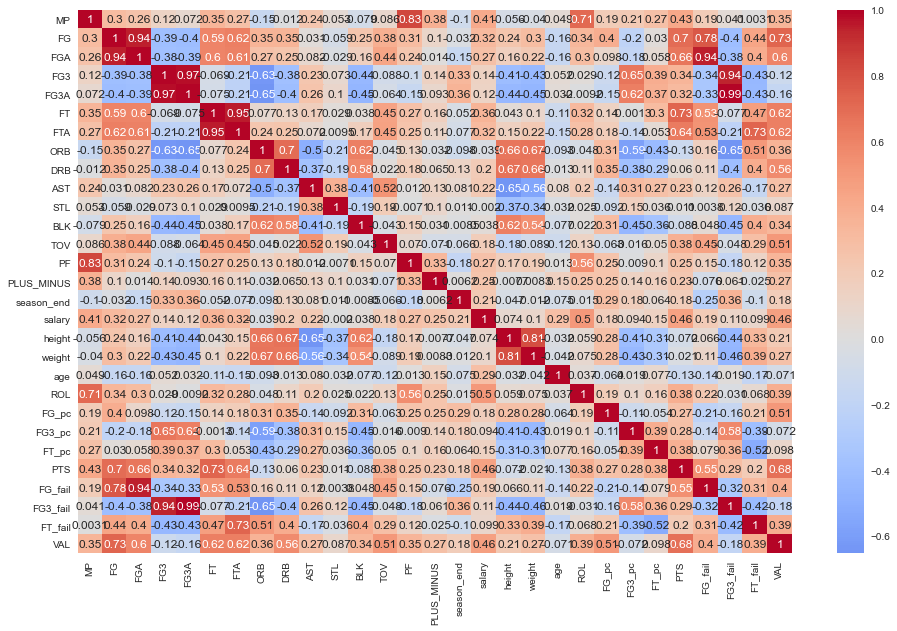

In [59]:
sns.heatmap(data_model.select_dtypes(exclude='object').corr(),
            annot=True, cmap='coolwarm', center=0)

#### PPS

Hemos buscado correlaciones con PPS, pero es bastante más pesimista

In [60]:
matrix = pps.matrix(data_model)

<AxesSubplot:xlabel='y', ylabel='x'>

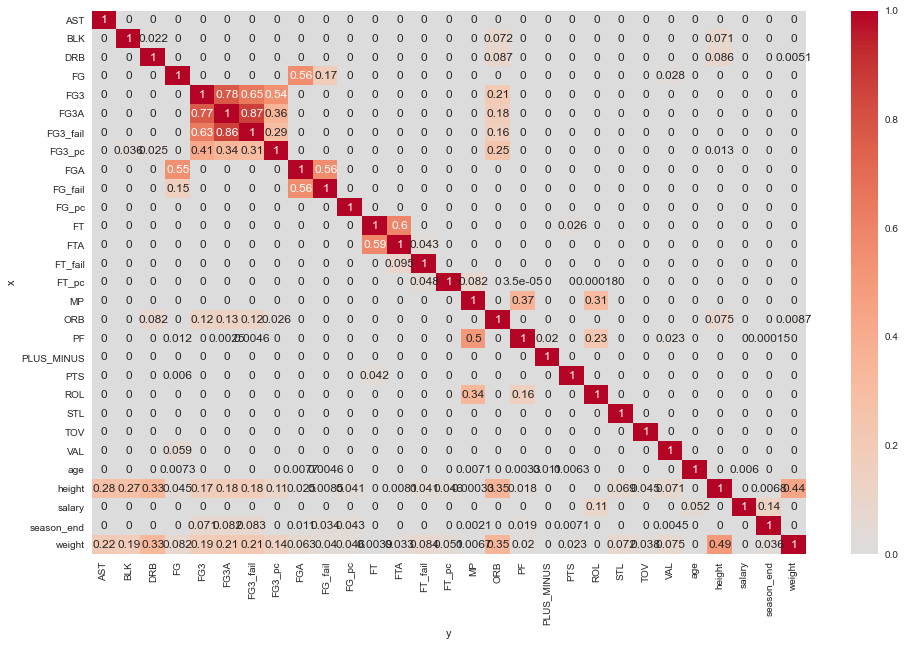

In [61]:
sns.heatmap(matrix.set_index(['x','y'])['ppscore'].unstack(), annot=True, cmap='coolwarm', center=0)

## Función del modelo

Creamos una función de regresión que pasaremos a distintas X e y en las que iremos seleccionando distintas variables. De esta forma podremos tener una idea de qué variables necesitamos incluir cuando queramos optimizar el modelo para obtener el mejor resultado.

In [62]:
def regression(X,y,classif,test_size=0.3):
    
    X_train, X_test, y_train,y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    
    clas = classif
    clas.fit(X_train, y_train)
    
    print('Train score', clas.score(X_train, y_train))
    print('Test score', clas.score(X_test, y_test))
  

### Variables correlacionadas

Eliminamos las variables poco correlacionadas y creamos la variable 'DEF' que suma las acciones defensivas: rebotes defensivos y recuperaciones.

In [63]:
data_model_test = data_model.drop(['FGA', 'FG3A', 'FTA', # Intentos
                                   'FG_fail', 'FG3_fail', 'FT_fail', # Fallos
                                   'FG_pc', 'FG3_pc', 'FT_pc', # Porcentajes
                                   'height', 'weight', # Peso y altura
                                    'ORB', 'STL', 'BLK', # Acciones defensivas no correlacionadas
                                    'FG3'  # Quitamos los triples, no correlacionados
                                   ],  
                                   axis=1)

In [64]:
data_model_test['DEF'] = data_model_test['DRB'] + data_model_test['TOV']

In [65]:
data_model_test.drop(['TOV', 'DRB'], axis=1, inplace=True)

Volvemos a mirar nuestras correlaciones

<AxesSubplot:>

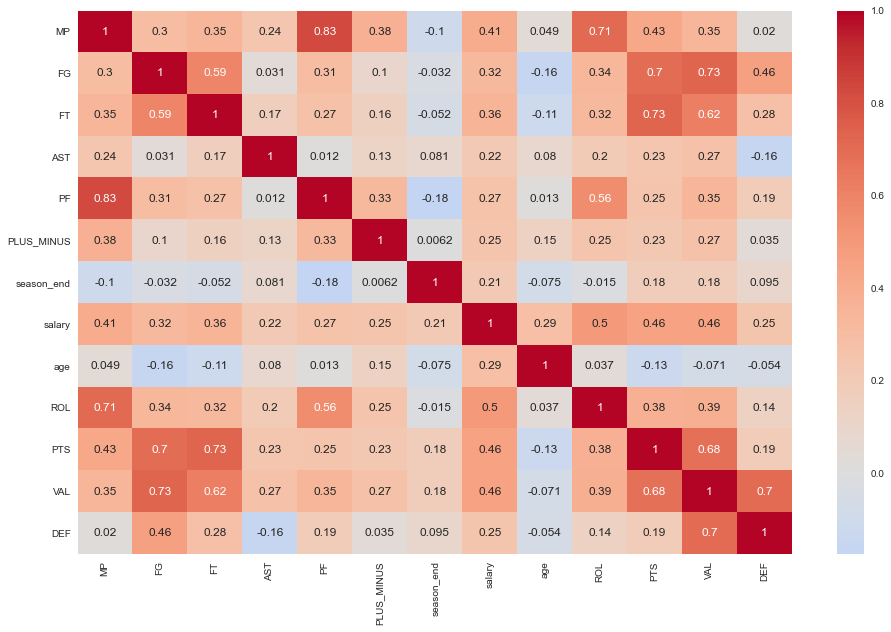

In [66]:
sns.heatmap(data_model_test.corr(), annot=True, cmap='coolwarm', center=0)

In [67]:
X = data_model_test.drop('salary', axis=1)
y = data_model_test['salary']

In [68]:
regression(X,y, classif= RandomForestRegressor())

Train score 0.947726037921241
Test score 0.6171453549878783


In [69]:
regression(X,y, classif= XGBRegressor())

Train score 0.946105945532282
Test score 0.6085666462614895


#### Sólo con datos de 2021

In [70]:
X = data_model_test[data_model_test['season_end']==2021].drop(['salary','season_end'], axis=1).select_dtypes(exclude=object)
y = data_model_test[data_model_test['season_end']==2021]['salary']

In [71]:
regression(X,y, classif= RandomForestRegressor())

Train score 0.9506344139359822
Test score 0.5565903323089996


In [72]:
regression(X,y, classif= XGBRegressor())

Train score 0.999999907332706
Test score 0.5459572916399491


### Todas las variables

In [73]:
X = data_model.drop('salary', axis=1)
y = data_model['salary']

In [74]:
regression(X,y, classif= RandomForestRegressor())

Train score 0.9488068992981706
Test score 0.6271819919872887


In [75]:
regression(X,y, classif= XGBRegressor())

Train score 0.9679270359398187
Test score 0.6271029739818268


#### Sólo con datos de 2021

In [76]:
X = data_model[data_model['season_end']==2021].drop(['salary','season_end'], axis=1).select_dtypes(exclude=object)
y = data_model[data_model['season_end']==2021]['salary']

In [77]:
regression(X,y, classif= RandomForestRegressor())

Train score 0.949140962984041
Test score 0.5626383265526657


In [78]:
regression(X,y, classif= XGBRegressor())

Train score 0.9999999991408542
Test score 0.479653584371724


### Todas las variables excepto combinaciones lineales

Como ya tenemos porcentajes de tiro, mantenemos sólo porcentaje y éxitos ya que el resto son combinaciones lineales.

In [79]:
X = data_model.drop(['salary',
                    'FGA', 'FG3A', 'FTA', # Intentos
                    'FG_fail', 'FG3_fail', 'FT_fail', # Fallos                
                     'VAL' # Valoración, ya que es combinación lineal del resto
                    ], axis=1)
y = data_model['salary']

In [80]:
regression(X,y, classif= RandomForestRegressor())

Train score 0.94940283244809
Test score 0.6325819090835476


In [81]:
regression(X,y, classif= XGBRegressor())

Train score 0.9643442210164338
Test score 0.6387396983245105


#### Sólo con datos de 2021

In [82]:
X = data_model[data_model['season_end']==2021].drop(['salary', 'season_end',
                                                'FGA', 'FG3A', 'FTA', # Intentos
                                                'FG_fail', 'FG3_fail', 'FT_fail', # Fallos 
                                                     'VAL' # Valoración, ya que es combinación lineal del resto
                                                ], axis=1)
y = data_model[data_model['season_end']==2021]['salary']

In [83]:
regression(X,y, classif= RandomForestRegressor())

Train score 0.9475414640008896
Test score 0.5653828104830432


In [84]:
regression(X,y, classif= XGBRegressor())

Train score 0.9999999995248785
Test score 0.4980864688313761


### Eliminando todas las variables que dependen de la valoración 'VAL'

In [85]:
data_model_solo_val = data_model.drop(['FG', 'FGA', 'FT', 'FTA', 'FG3', 'FG3A',
                                       'FG_fail', 'FT_fail', 'FG3_fail',
                                      'ORB', 'DRB', 'AST', 'STL', 'BLK', 'TOV',
                                      'FG_pc', 'FG3_pc', 'FT_pc', 'PTS', 
                                       'height', 'weight'], axis=1)

<AxesSubplot:>

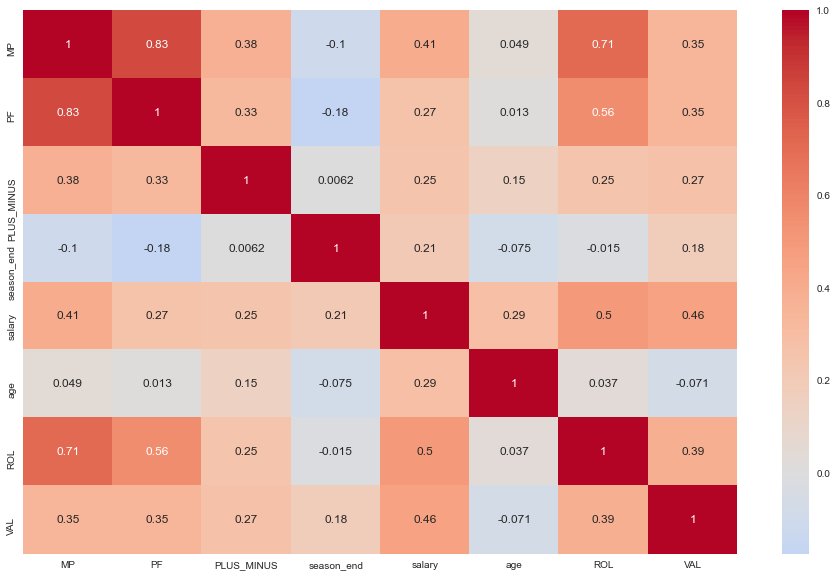

In [86]:
sns.heatmap(data_model_solo_val.corr(),
            annot=True, cmap='coolwarm', center=0)

In [87]:
X = data_model_solo_val.drop('salary', axis=1)
y = data_model_solo_val['salary']

In [88]:
regression(X,y, classif= RandomForestRegressor())

Train score 0.9436415198878447
Test score 0.5910900678253903


In [89]:
regression(X,y, classif= XGBRegressor())

Train score 0.9116572735155511
Test score 0.5728086416203609


#### Sólo con datos de 2021

In [90]:
X = data_model_solo_val[data_model_solo_val['season_end']==2021].drop(['salary','season_end'], axis=1)
y = data_model_solo_val[data_model_solo_val['season_end']==2021]['salary']

In [91]:
regression(X,y, classif= RandomForestRegressor())

Train score 0.9494659247434203
Test score 0.5392639045949275


In [92]:
regression(X,y, classif= XGBRegressor())

Train score 0.9999969480352981
Test score 0.5211764297570507


Se puede comprobar que siempre obtenemos mejores resultados cuando incluimos todos los años y dejamos la variable 'season_end', con lo cual será mejor hacer un modelo con las observaciones de todos los años y mantener la variable 'season_end' en lugar de hacer un modelo por cada año.

Respecto a las variables, los mejores scores los hemos obtenido cuando hemos eliminado las variables que son combinaciones lineales de otras.

En el caso de los tiros, se han borrado los éxitos y los fallos ya que con los intentos y el porcentaje de acierto tenemos toda la información.

Se ha borrado también la variable valoración ya que también es una combinación lineal de otras que ya teníamos incluidas.

# XGboost

Usaremos XGBoost para hacer grid search e identificar los parámetros que puedan mejorar nuestro modelo.

Creamos la función para obtener los parámetros más óptimos.

In [93]:
def xgboost_params(X_te, y_te, X_tr, y_tr, parameters):
    model = XGBRegressor()
    
    model_sel = GridSearchCV(model,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose = True)
    
    model_sel.fit(X_tr, y_tr)
    
    print('Score: ', model_sel.best_score_)
    print('Params: ', model_sel.best_params_)
    print('Score train: ', model_sel.best_estimator_.score(X_tr, y_tr))
    print('Score test: ', model_sel.best_estimator_.score(X_te, y_te))

Creamos un diccionario con los parámetros entre los que se va a iterar.

In [94]:
params = {'nthread':[4],
              'objective':['reg:linear'],
              'learning_rate': [.03, .05, .07], 
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500],
              'gamma': np.linspace(0,1,5),
              'booster': ['gbtree', 'dart'],
              }

Asignamos las (X,y) que nos han dado mejor resultado, que es con todas las variables y sin información redundante, es decir, variables que son combinaciones lineales de otras.

In [95]:
X = data_model.drop(['salary',
                    'FGA', 'FG3A', 'FTA', # Intentos
                    'FG_fail', 'FG3_fail', 'FT_fail', # Fallos                
                     'VAL' # Valoración, ya que es combinación lineal del resto
                    ], axis=1).select_dtypes(exclude=object)
y = data_model['salary']

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [97]:
xgboost_params(X_test, y_test, X_train, y_train, params)

Fitting 2 folds for each of 90 candidates, totalling 180 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
/Users/borjatv/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:   54.1s
[Parallel(n_jobs=5)]: Done 180 out of 180 | elapsed: 10.2min finished


[16:08:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:08:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Score:  0.6415242987656733
Params:  {'booster': 'dart', 'colsample_bytree': 0.7, 'gamma': 0.0, 'learning_rate': 0.03, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}
Score train:  0.860918411673892
Score test:  0.6654628257262634


Estos son los parámetros que mejor resultado nos darán en el modelo.

In [98]:
model = XGBRegressor(booster= 'dart', 
             colsample_bytree= 0.7, 
             gamma= 0.0, 
             learning_rate= 0.03, 
             max_depth= 5, 
             min_child_weight= 4, 
             n_estimators= 500, 
             nthread= 4, 
             objective= 'reg:linear', 
             silent= 1, 
             subsample= 0.7)

## XGBoost - outliers

Usaremos la función 'limits' anteriormente creada que elimina los outliers en función del porcentaje dado y pasaremos el dataframe resultante a un modelo con los parámetros óptimos que acabamos de obtener.

Pasaremos esta función con diferentes valores de porcentajes de outliers desde 0 hasta 0.25 para poder ver con qué valor obtenemos un mejor resultado.

In [99]:
def scores_outliers_xgb():
    
    outlier_points = np.linspace(0,0.25,26)
    train_score = []
    test_score = []
    
    for pct in outlier_points:
    
        # Imprimimos el nº de outliers y el % de observaciones que representan
        data_wout = limits(data_model, data_model.columns.drop(['season_end']), pct)
        Xwout = data_wout.drop(['salary',
                    'FGA', 'FG3A', 'FTA', # Intentos
                    'FG_fail', 'FG3_fail', 'FT_fail', # Fallos                
                     'VAL' # Valoración, ya que es combinación lineal del resto
                    ], axis=1)
        ywout = data_wout['salary']
        
        # Train, test, split
        X_c_train, X_c_test, y_c_train, y_c_test = train_test_split(Xwout, ywout, test_size=0.3, random_state=42)
        
        # Creamos el modelo con nuestros parámetros óptimos    
        mod = XGBRegressor(booster= 'dart', 
                 colsample_bytree= 0.7, 
                 gamma= 0.0, 
                 learning_rate= 0.03, 
                 max_depth= 5, 
                 min_child_weight= 4, 
                 n_estimators= 500, 
                 nthread= 4, 
                 objective= 'reg:linear', 
                 silent= 1, 
                 subsample= 0.7)
        
        # Lo entrenamos
        mod.fit(X_c_train, y_c_train)
        
        # Añadimos los resultados a nuestra lista
        train_score.append(mod.score(X_c_train,y_c_train))
        test_score.append(mod.score(X_c_test,y_c_test))
        
    # Plot de los resultados
    plt.plot(outlier_points, train_score, marker='o', label='Train data')
    plt.plot(outlier_points, test_score, marker='o', label='Test data')
    plt.xlabel('Outlier %')
    plt.ylabel('Score')
    plt.legend()
    plt.show()


0 outliers
8635 observaciones
0.0 %
[16:09:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:09:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


0 outliers
8635 observaciones
0.0 %
[16:09:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:09:17] WARNING: /opt/concourse/wo

264 outliers
8635 observaciones
0.03 %
[16:11:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:11:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


333 outliers
8635 observaciones
0.04 %
[16:11:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:11:57] WARNING: /opt/concou

2082 outliers
8635 observaciones
0.24 %
[16:14:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:14:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


2433 outliers
8635 observaciones
0.28 %
[16:14:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:14:19] WARNING: /opt/conc

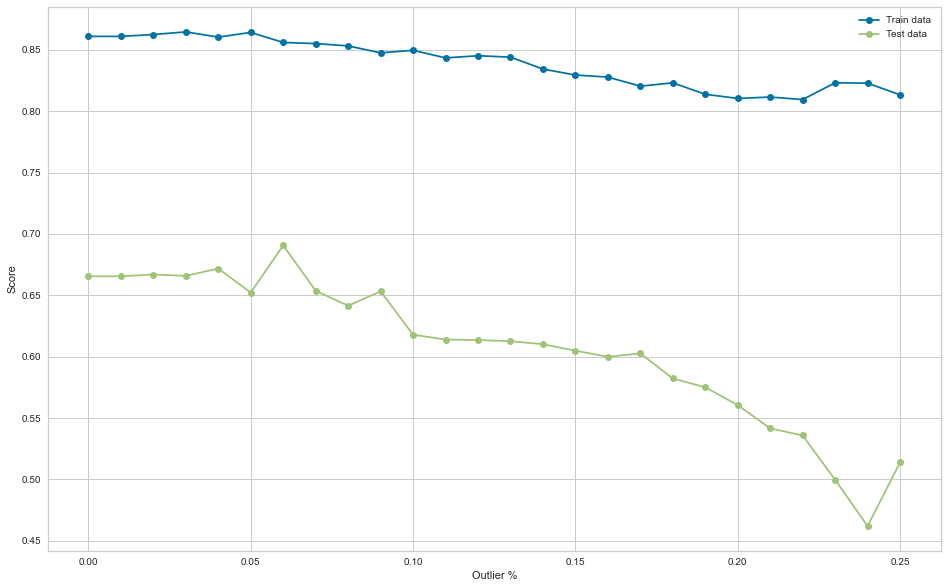

In [100]:
scores_outliers_xgb()

Como podemos ver en la gráfica al final del output, el mejor resultado lo obtenemos con un porcentaje de 0.06, llegando casi a un score del 70% con los datos de test.

Hay una mejora considerable respecto al 63% obtenido con RandomForestRegressor y XGBRegressor sin hacer GridSearch ni eliminar outliers.

## Ejecución del modelo

Ya tenemos los parámetros y el porcentaje de outliers óptimo. Ejecutamos el modelo con nuestras (X,y) sin outliers y aplicamos GridSearch por última vez.

Lo haremos paso por paso fuera de la función para poder trabajar con él posteriormente.

In [101]:
# Pasamos el df a la función que elimina los outliers con el porcentaje obtenido anteriormente 0.06

dataout = limits(data_model, data_model.columns.drop('season_end'), 0.06) # No aplicamos outliers a la temporada


36 outliers
8635 observaciones
0.0 %


In [102]:
# Asignamos (X,y)

X = dataout.drop(['salary', # Variable objetivo
                    'FGA', 'FG3A', 'FTA', # Intentos
                    'FG_fail', 'FG3_fail', 'FT_fail', # Fallos                
                     'VAL' # Valoración, ya que es combinación lineal del resto
                    ], axis=1)
y = dataout['salary']

In [103]:
# Train, test, split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [104]:
# Creamos el modelo con los parámetros óptimos obtenidos anteriormente

model = XGBRegressor(booster= 'dart', 
         colsample_bytree= 0.7, 
         gamma= 0.0, 
         learning_rate= 0.03, 
         max_depth= 5, 
         min_child_weight= 4, 
         n_estimators= 500, 
         nthread= 4, 
         objective= 'reg:linear', 
         silent= 1, 
         subsample= 0.7)

In [105]:
# Entrenamos el modelo

model.fit(X_train, y_train)

[16:14:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:14:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




XGBRegressor(base_score=0.5, booster='dart', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0.0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.03, max_delta_step=0, max_depth=5,
             min_child_weight=4, missing=nan, monotone_constraints='()',
             n_estimators=500, n_jobs=4, nthread=4, num_parallel_tree=1,
             objective='reg:linear', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, silent=1, subsample=0.7, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [106]:
# Imprimimos los resultados
print(f'Train score: {model.score(X_train, y_train)}')
print(f'Test score: {model.score(X_test, y_test)}')

Train score: 0.8559620833679669
Test score: 0.6906672253428985


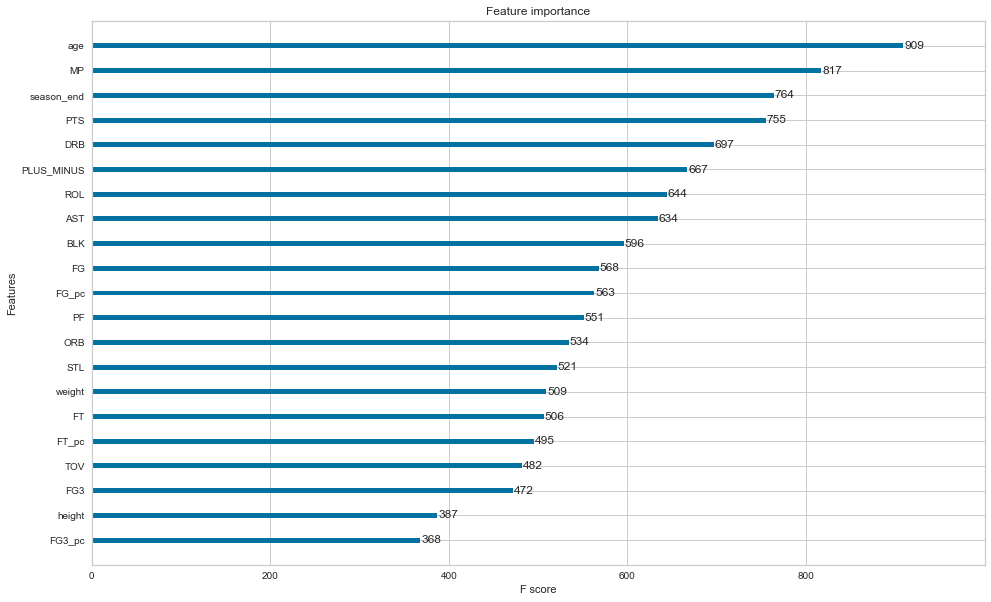

In [107]:
# Imprimimos las feature importances

plot_importance(model)
plt.show()

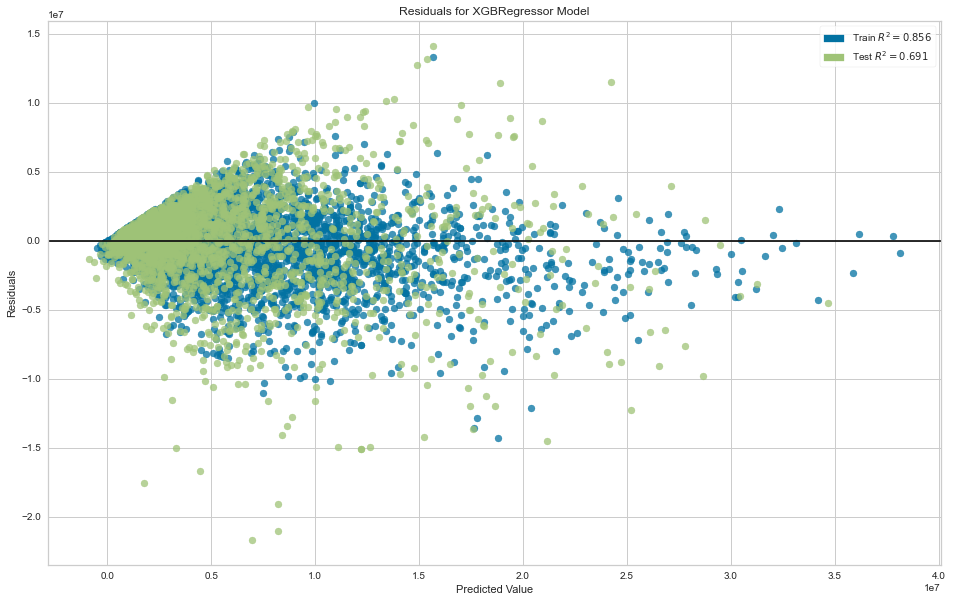

<AxesSubplot:title={'center':'Residuals for XGBRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [108]:
# Imprimimos los residuals

visualizer = ResidualsPlot(model, hist=False)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

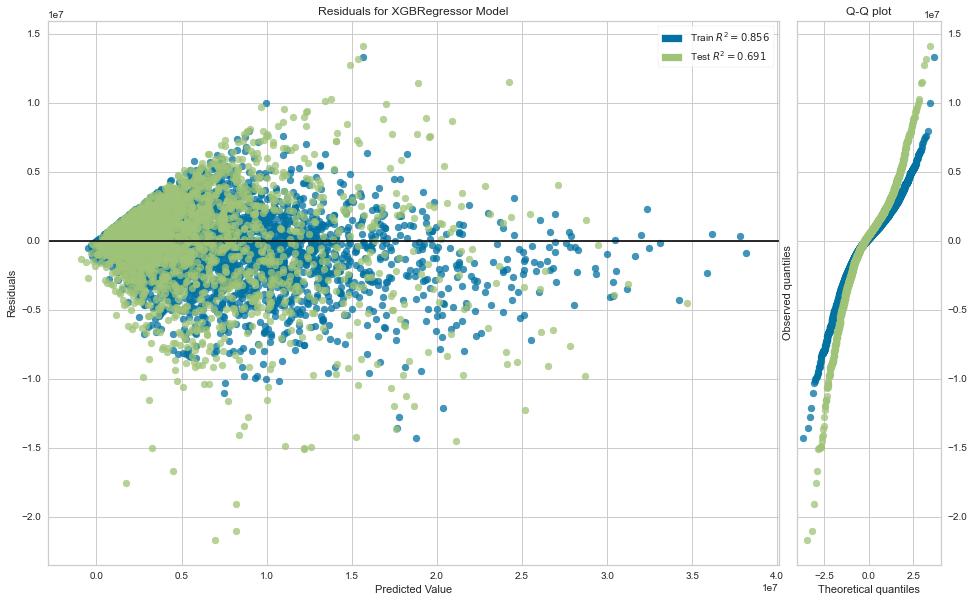

<AxesSubplot:title={'center':'Residuals for XGBRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [109]:
# Residuals con Q-Q plot

visualizer = ResidualsPlot(model, hist=False, qqplot=True)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

In [110]:
# Mean squared error

preds = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))

RMSE: 3280073.588405


# Aplicación del modelo

**¿Está un jugador actual sobrevalorado?**

Creamos una columna en el df principal con los salarios predecidos.

In [111]:
data_exported_pg['predicted_salary'] = model.predict(data_exported_pg[X_test.columns])

En el siguiente programa podremos seleccionar un jugador de esta temporada y nos dirá si está sobrevalorado o no.

In [112]:
@interact(jug=data_exported_pg[data_exported_pg['season_end']==2021].reset_index(drop=True)['player'].values)

def is_overrated_2021(jug):
    """Define si a un jugador se le está pagando de más o de menos en función de sus estadísticas
    en los partidos de la última temporada regular 2020/2021"""
        
    # Extraer valores del dataframe
    current_salary = data_exported_pg[(data_exported_pg['player']==jug)&(data_exported_pg['season_end']==2021)]['salary'].values.item()
    predicted_salary = data_exported_pg[(data_exported_pg['player']==jug)&(data_exported_pg['season_end']==2021)]['predicted_salary'].values.item()
    
    print(f'${round(current_salary/1e6, 2)} M - salario actual')
    print(f'${round(predicted_salary/1e6, 2)} M - salario predecido')
    
    if current_salary > predicted_salary:
        print(f'${round((current_salary - predicted_salary)/1e6, 2)} M - sobresueldo')
        
    else:
        print(f'${round((predicted_salary - current_salary)/1e6,2)} M - aumento merecido')

interactive(children=(Dropdown(description='jug', options=('Aaron Gordon', 'Aaron Holiday', 'Aaron Nesmith', '…

# Extra: Modelo por posición

Hemos probado a ejecutar el mismo modelo pero habiendo filtrado previamente por posición, ya que es posible que para un pivot, por ejemplo, hay unas características más importantes que para un base.

Con la siguiente función podemos seleccionar la posición y nos devolverá el score que obtendríamos.

In [113]:
@interact(pos = positions)

def score_by_position(pos):
    
    # Asignamos un df con las variables que vamos a usar
    datapos = data_exported_pg[data_exported_pg['pos_label']==pos].drop(['player', 'team', 'labels', # Categóricas
                                                'pos_PG', 'pos_C', 'pos_PF', 'pos_SG', 'pos_SF', # Posiciones
                                                'hand_right', 'hand_left',
                                                'FGA', 'FG3A', 'FTA', # Intentos
                                                'FG_fail', 'FG3_fail', 'FT_fail', # Fallos                
                                                'VAL' # Valoración, ya que es combinación lineal del resto# Mano
                                                ], axis=1).drop('pos_label', axis=1)
    
    # Le pasamos la función para eliminar los outliers con el valor del % anteriormente obtenido de 0.06
    dataout = limits(datapos, datapos.columns.drop(['season_end']), 0.06) # No aplicamos outliers a la temporada
    
    # Asignamos (X,y)
    Xpfout = dataout.drop('salary', axis=1)
    ypfout = dataout['salary']
    
    # Train, test, split
    Xpf_train, Xpf_test, ypf_train, ypf_test = train_test_split(Xpfout, ypfout, test_size=0.3, random_state=42)
    
    # Creamos el modelo con los parámetros óptimos obtenidos anteriormente
    modpf = XGBRegressor(booster= 'dart', 
             colsample_bytree= 0.7, 
             gamma= 0.0, 
             learning_rate= 0.03, 
             max_depth= 5, 
             min_child_weight= 4, 
             n_estimators= 500, 
             nthread= 4, 
             objective= 'reg:linear', 
             silent= 1, 
             subsample= 0.7)
    
    # Entrenamos el modelo
    modpf.fit(Xpf_train, ypf_train)
    
    # Imprimimos los resultados
    print(f'Train score: {modpf.score(Xpf_train,ypf_train)}')
    print(f'Test score: {modpf.score(Xpf_test,ypf_test)}')
    
    # Imprimimos las feature importances para esa posición
    plot_importance(modpf)
    plt.show()
    

interactive(children=(Dropdown(description='pos', options=('C', 'PF', 'SF', 'SG', 'PG'), value='C'), Output())…

Si bien vemos cómo las feature importances cambian en función de la posición, no es recomendable mantener este modelo por posición ya que apenas se puede mejorar un 1% el modelo anterior en la posición de 'PF', pero a costa de sacrificar hasta un 15% en otras posiciones.

# Extra 2: eliminar datos de 2021 en X_train para evitar overfitting

Nuestro modelo tiene un train score de 0.855 y un test score de 0.691, lo que quiere decir que puede comportarse de forma distinta al predecir valores de X_train o de X_test.

Esto puede tener un impacto a la hora de predecir valores ya existentes. No vamos a predecir el salario para un jugador para el cual no tenemos las estadísticas y por eso el efecto puede ser más conservador si el jugador está en X_train y más agresivo si está en X_test.

Para que trate todos los valores de 2021, que son los que queremos predecir, de igual forma, podemos eliminar dichos valores del modelo. El score bajará y las predicciones de salario distarán de los salarios actuales, es decir, tendremos un modelo menos conservador.

In [114]:
# Asignamos (X,y)

X2 = dataout[dataout['season_end']!=2021].drop(['salary', # Variable objetivo
                    'FGA', 'FG3A', 'FTA', # Intentos
                    'FG_fail', 'FG3_fail', 'FT_fail', # Fallos                
                     'VAL' # Valoración, ya que es combinación lineal del resto
                    ], axis=1)
y2 = dataout[dataout['season_end']!=2021]['salary']

In [115]:
# Train, test, split

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3, random_state=42)

In [116]:
# Creamos el modelo con los parámetros óptimos obtenidos anteriormente

model2 = XGBRegressor(booster= 'dart', 
         colsample_bytree= 0.7, 
         gamma= 0.0, 
         learning_rate= 0.03, 
         max_depth= 5, 
         min_child_weight= 4, 
         n_estimators= 500, 
         nthread= 4, 
         objective= 'reg:linear', 
         silent= 1, 
         subsample= 0.7)

In [117]:
# Entrenamos el modelo

model2.fit(X2_train, y2_train)

[16:14:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:14:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




XGBRegressor(base_score=0.5, booster='dart', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0.0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.03, max_delta_step=0, max_depth=5,
             min_child_weight=4, missing=nan, monotone_constraints='()',
             n_estimators=500, n_jobs=4, nthread=4, num_parallel_tree=1,
             objective='reg:linear', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, silent=1, subsample=0.7, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [118]:
# Imprimimos los resultados
print(f'Train score: {model2.score(X2_train, y2_train)}')
print(f'Test score: {model2.score(X2_test, y2_test)}')

Train score: 0.8605246699484594
Test score: 0.6524596978473656


Creamos un nuevo dataframe con los datos de 2021 y le asignamos los valores predecidos para compararlos con el modelo anterior.

In [119]:
datos2021 = data_exported_pg[data_exported_pg['season_end']==2021]

In [120]:
datos2021['predicted_salary'] = model2.predict(datos2021[X2_test.columns])

<ipython-input-120-5c65885a82f8>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [121]:
@interact(jug=datos2021.reset_index(drop=True)['player'].values)

def is_overrated_2021_2(jug):
    """Define si a un jugador se le está pagando de más o de menos en función de sus estadísticas
    en los partidos de la última temporada regular 2020/2021"""
        
    # Extraer valores del dataframe
    current_salary = datos2021[(datos2021['player']==jug)&(datos2021['season_end']==2021)]['salary'].values.item()
    predicted_salary = datos2021[(datos2021['player']==jug)&(datos2021['season_end']==2021)]['predicted_salary'].values.item()
    
    print(f'${round(current_salary/1e6, 2)} M - salario actual')
    print(f'${round(predicted_salary/1e6, 2)} M - salario predecido')
    
    if current_salary > predicted_salary:
        print(f'${round((current_salary - predicted_salary)/1e6, 2)} M - sobresueldo')
        
    else:
        print(f'${round((predicted_salary - current_salary)/1e6,2)} M - aumento merecido')

interactive(children=(Dropdown(description='jug', options=('Aaron Gordon', 'Aaron Holiday', 'Aaron Nesmith', '…

Con la siguiente expresión contaremos para cuántos jugadores de 2021 han coincidido ambos modelos en que se le estaba pagando de más o de menos (True) y para cuántos hay discrepancia.

In [122]:
((datos2021['predicted_salary'] - datos2021['salary']>0) == (data_exported_pg[data_exported_pg['season_end']==2021]['predicted_salary'] - data_exported_pg[data_exported_pg['season_end']==2021]['salary']>0)).value_counts()

True     412
False     46
dtype: int64

Imprimimos los jugadores para los cuales ha habido discrepancia

In [123]:
ser = ((datos2021['predicted_salary'] - datos2021['salary']>0) == (data_exported_pg[data_exported_pg['season_end']==2021]['predicted_salary'] - data_exported_pg[data_exported_pg['season_end']==2021]['salary']>0))

In [124]:
for a in ser[ser == False].index:
    print(datos2021.loc[a][['player', 'age', 'pos_label', 'salary', 'VAL', 'MP']])
    print('\n')

player       Anfernee Simons
age                       21
pos_label                 SG
salary           2.25204e+06
VAL                  24.3874
MP                   1198.65
Name: 8193, dtype: object


player       Brook Lopez
age                   32
pos_label              C
salary       1.26977e+07
VAL              28.8603
MP               2380.02
Name: 8217, dtype: object


player       Bruno Fernando
age                      22
pos_label                 C
salary          1.51798e+06
VAL                 30.6776
MP                  220.617
Name: 8219, dtype: object


player       Cassius Winston
age                       22
pos_label                 PG
salary                  4737
VAL                  26.2295
MP                    100.65
Name: 8231, dtype: object


player       Chandler Hutchison
age                          24
pos_label                    SF
salary              2.44344e+06
VAL                     23.7934
MP                      385.317
Name: 8233, dtype: object


pl

Como podemos observar, los modelos coinciden en casi un 90% de los datos.

# Conclusión

La conclusión que podemos extraer es que, si bien es muy preciso decidir si un jugador está sobrepagado o no (en ambos modelos coinciden en un 90% de los casos), puede resultar algo más complicado definir un salario en función de las variables que tenemos ya que hay bastante error entre ellas y las franquicias no sólo no siempre aciertan ajustando dichos salarios sino que entran otros temas. Por ejemplo, si un jugador hace un buen año y consigue un buen contrato para los próximos X años pero baja el rendimiento en dichos años, generará bastante ruido en nuestro modelo.

No obstante, hemos conseguido 2 modelos con 2 enfoques distintos, uno más conservador y otro más agresivo, con lo que ejecutando ambos y combinándolo con las visualizaciones de datos, sí que podremos al menos conocer el rango en el que debería oscilar el salario de un jugador.

In [125]:
@interact(jug=datos2021.reset_index(drop=True)['player'].values)

def is_overrated_2021_both(jug):
    """Define si a un jugador se le está pagando de más o de menos en función de sus estadísticas
    en los partidos de la última temporada regular 2020/2021"""
        
    # Extraer valores del dataframe
    current_salary = datos2021[(datos2021['player']==jug)&(datos2021['season_end']==2021)]['salary'].values.item()
    predicted_salary_2 = datos2021[(datos2021['player']==jug)&(datos2021['season_end']==2021)]['predicted_salary'].values.item()
    predicted_salary_1 = data_exported_pg[(data_exported_pg['player']==jug)&(data_exported_pg['season_end']==2021)]['predicted_salary'].values.item()
    
    print(f'${round(current_salary/1e6, 2)} M - salario actual')
    print(f'${round(predicted_salary_1/1e6, 2)} M - salario predecido (modelo conservador)')
    print(f'${round(predicted_salary_2/1e6, 2)} M - salario predecido (modelo agresivo)')
    


interactive(children=(Dropdown(description='jug', options=('Aaron Gordon', 'Aaron Holiday', 'Aaron Nesmith', '…